In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import nltk
import warnings
warnings.filterwarnings("ignore")

Load the data into a DataFrame

In [2]:
df = pd.read_csv('F:\\aiQuest Intelligence\\ML\Data\\listings.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,13913,Rental unit in Islington · ★4.80 · 1 bedroom ·...,54730,Alina,NaN,Islington,51.56861,-0.11270,Private room,79,1,41,2022-12-11,0.26,2,360,11,NaN
1,15400,Rental unit in London · ★4.80 · 1 bedroom · 1 ...,60302,Philippa,NaN,Kensington and Chelsea,51.48780,-0.16813,Entire home/apt,150,7,94,2023-05-01,0.56,1,73,5,NaN
2,92644,Rental unit in Earlsfield · ★4.57 · 1 bedroom ...,498201,Dee Dee,NaN,Wandsworth,51.44201,-0.18739,Private room,42,2,216,2022-10-29,1.45,1,217,9,NaN
3,17402,Rental unit in London · ★4.76 · 3 bedrooms · 3...,67564,Liz,NaN,Westminster,51.52195,-0.14094,Entire home/apt,476,3,54,2022-11-19,0.36,9,300,4,NaN
4,93015,Rental unit in Hammersmith · ★4.82 · 2 bedroom...,499704,Sarah,NaN,Hammersmith and Fulham,51.49993,-0.21707,Entire home/apt,175,5,38,2022-09-30,0.27,1,40,2,NaN


In [3]:
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             6
neighbourhood_group               87947
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       22158
reviews_per_month                 22158
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           87946
dtype: int64

**Quantifiable Questions**

**Question 1: What is the average price of a rental unit in each neighborhood?**

In [4]:
df = pd.DataFrame(df)

# Calculate the average price of a rental unit in each neighborhood
neighborhood_avg_price = df.groupby('neighbourhood')['price'].mean()

# Display the result
print("Average Price of a Rental Unit in Each Neighborhood:")
print(neighborhood_avg_price.replace(to_replace=0, method='ffill'))

Average Price of a Rental Unit in Each Neighborhood:
neighbourhood
Barking and Dagenham      245.840426
Barnet                    160.523344
Bexley                     95.046465
Brent                     179.079197
Bromley                   105.972798
Camden                    203.288171
City of London            243.722015
Croydon                    91.065737
Ealing                    125.220839
Enfield                   107.159756
Greenwich                 121.996367
Hackney                   132.932223
Hammersmith and Fulham    177.230830
Haringey                  149.827876
Harrow                    105.491054
Havering                  118.190355
Hillingdon                103.409038
Hounslow                  182.455706
Islington                 173.169198
Kensington and Chelsea    307.432795
Kingston upon Thames      134.835714
Lambeth                   141.038752
Lewisham                  107.333979
Merton                    153.220922
Newham                    151.510169
Redbridg

**Question 2: What is the correlation between the number of reviews and the price of a rental unit?**

In [30]:
correlation_reviews_price = df['number_of_reviews'].corr(df['price'])
print("\nCorrelation Between Reviews and Price:")
print(correlation_reviews_price)


Correlation Between Reviews and Price:
-0.02469341210043812


**Question 3: What is the average price of a rental unit by room type (Private room vs. Entire home/apt)?**

In [6]:
room_type_prices = df.groupby('room_type')['price'].mean()
print(room_type_prices)

room_type
Entire home/apt    230.167198
Hotel room         256.095890
Private room       100.231207
Shared room        119.716553
Name: price, dtype: float64


**Question 4: What is the average number of reviews per month for rental units in each neighborhood?**

In [7]:
neighborhood_reviews_per_month = df.groupby('neighbourhood')['reviews_per_month'].mean()
print(neighborhood_reviews_per_month)

neighbourhood
Barking and Dagenham      0.937929
Barnet                    0.956372
Bexley                    1.021686
Brent                     1.015458
Bromley                   0.907686
Camden                    1.212784
City of London            1.509806
Croydon                   1.010850
Ealing                    0.972872
Enfield                   0.925361
Greenwich                 0.974912
Hackney                   0.786591
Hammersmith and Fulham    0.971350
Haringey                  0.938421
Harrow                    0.927882
Havering                  0.963649
Hillingdon                1.243779
Hounslow                  1.058526
Islington                 0.963910
Kensington and Chelsea    0.978697
Kingston upon Thames      0.959662
Lambeth                   1.034639
Lewisham                  0.814947
Merton                    0.819305
Newham                    1.092041
Redbridge                 0.914096
Richmond upon Thames      1.024398
Southwark                 1.048965
Sutton

**Question 5: What is the percentage of rental units with a license?**

In [8]:
non_null_count = df['license'].dropna().count()
license_percentage = (non_null_count / len(df)) * 100

print(license_percentage)

0.001137048449634439


**Question 6: What is the average availability of rental units throughout the year?**

In [9]:
average_availability = df['availability_365'].mean()
print(average_availability)

121.11558097490534


**Question 7: What is the average number of reviews for rental units listed by each host?**

In [10]:
host_reviews = df.groupby('host_id')['number_of_reviews'].mean()
print(host_reviews)

host_id
4775         132.500000
4879           3.000000
6774          31.142857
9323          78.000000
9870           0.000000
                ...    
535423144      0.000000
535435477      0.000000
535469107      0.000000
535479813      0.000000
535514014      0.000000
Name: number_of_reviews, Length: 53395, dtype: float64


**Answer Non-Quantifiable Questions**

**Q8: How does the price of rental units vary with respect to the type of accommodation (Private room vs. Entire home/apt)?**

Analyze the difference in average price between Private rooms and Entire homes/apts

In [11]:
private_room_price = df[df['room_type'] == 'Private room']['price'].mean()
entire_home_apt_price = df[df['room_type'] == 'Entire home/apt']['price'].mean()
price_difference = entire_home_apt_price - private_room_price

Interpret the price difference and provide insights

In [12]:
print("\nPrice Variation with Room Type:")
print("Average Price for Private Rooms:", private_room_price)
print("Average Price for Entire Homes/Apts:", entire_home_apt_price)
print("Price Difference:", price_difference)


Price Variation with Room Type:
Average Price for Private Rooms: 100.23120662773991
Average Price for Entire Homes/Apts: 230.16719803576663
Price Difference: 129.93599140802672


**Q9: What are the most popular neighborhoods for rental units in London?**

Identify the top neighborhoods based on the number of reviews

In [13]:
top_neighborhoods = df.groupby('neighbourhood')['number_of_reviews'].sum().sort_values(ascending=False).head(3)
print(top_neighborhoods)

neighbourhood
Westminster      198838
Camden           143284
Tower Hamlets    123600
Name: number_of_reviews, dtype: int64


Display the top neighborhoods and their corresponding review counts

In [14]:
print("\nMost Popular Neighborhoods:")
for neighborhood, review_count in top_neighborhoods.items():
    print(f"{neighborhood}: {review_count} reviews")


Most Popular Neighborhoods:
Westminster: 198838 reviews
Camden: 143284 reviews
Tower Hamlets: 123600 reviews


**Q10: What are some of the unique features or amenities that make certain rental units stand out from the competition?**

Analyze the data to identify unique features or amenities that are not common across all listings

In [15]:
unique_features = []

# Iterate through each listing and extract unique features
for index, row in df.iterrows():
    listing_description = row['name']
    # Extract unique features from the listing description and append them to the 'unique_features' list
    for feature in listing_description.split():
        if feature not in unique_features:
            unique_features.append(feature)

# Display the identified unique features
print("\nUnique Features and Amenities:")
for feature in unique_features:
    print(feature)


Unique Features and Amenities:
Rental
unit
in
Islington
·
★4.80
1
bedroom
bed
shared
bath
London
Earlsfield
★4.57
2
beds
1.5
baths
★4.76
3
bedrooms
Hammersmith
★4.82
Condo
★4.62
Townhouse
★4.90
★4.73
Home
Barnet
★4.78
Poplar
★4.85
★4.72
Lewisham
St
Margaret's,
Isleworth
★4.40
private
Lambeth
★4.86
Greater
★4.54
Highgate,
★4.46
Richmond
★4.75
East
Finchley
0
★4.83
4
★4.91
★4.95
★4.92
★4.50
★5.0
★4.84
★4.56
Houseboat
Central
Narrowboat
Hounslow
★4.67
Walthamstow
2.5
★4.89
★4.88
Kensington
Camden
Town
★4.79
★4.69
Hackney
Ealing
Serviced
apartment
Notting
Hill
Muswell
Croydon
★4.63
★4.71
Aparthotel
★4.68
Tottenham
Paddington
★4.55
Camberwell
Fulham
Morden
★4.98
Wandsworth
★4.81
★4.77
★4.41
★4.34
★4.87
★4.74
★4.70
Loft
★4.94
Flat
2,
150
Addison
Gardens,
★4.97
Romford
★4.42
Feltham
Tiny
home
Islington,
★4.47
Enfield
Guest
suite
5
★4.61
Merton
★4.13
★3.84
★4.0
★4.52
★4.38
★4.93
★4.29
Studio
Pinner
Ham
★4.24
8
★4.48
★3.88
6
★4.65
Twickenham
★4.28
Hillingdon
★4.14
★4.59
★4.26
Ruislip
Bromley
D

**Non-quantifiable Questions**

**Part 2: Core Analysis**

**Q1: How does the price of rental units vary with respect to the type of accommodation (Private room vs. Entire home/apt)?**

In [16]:
# Calculate the average price for each room type
private_room_price = df[df['room_type'] == 'Private room']['price'].mean()
entire_home_apt_price = df[df['room_type'] == 'Entire home/apt']['price'].mean()
price_difference = entire_home_apt_price - private_room_price

print("Private Room Price:", private_room_price)
print("Entire Home/Apt Price:", entire_home_apt_price)
print("Price Difference:", price_difference)

Private Room Price: 100.23120662773991
Entire Home/Apt Price: 230.16719803576663
Price Difference: 129.93599140802672


**Q2: What are the most popular neighborhoods for rental units in London?**

In [17]:
# Identify the top neighborhoods based on the number of reviews
top_neighborhoods = df.groupby('neighbourhood')['number_of_reviews'].sum().sort_values(ascending=False).head(3)

# Display the top neighborhoods and their corresponding review counts
print("Top 3 Most Popular Neighborhoods:")
for neighborhood, review_count in top_neighborhoods.items():
    print(f"{neighborhood}: {review_count} reviews")

Top 3 Most Popular Neighborhoods:
Westminster: 198838 reviews
Camden: 143284 reviews
Tower Hamlets: 123600 reviews


In [18]:
# Core Analysis
average_reviews_per_host = df.groupby('host_id')['number_of_reviews'].mean()
print("\nAverage Number of Reviews per Host:")
print(average_reviews_per_host)



Average Number of Reviews per Host:
host_id
4775         132.500000
4879           3.000000
6774          31.142857
9323          78.000000
9870           0.000000
                ...    
535423144      0.000000
535435477      0.000000
535469107      0.000000
535479813      0.000000
535514014      0.000000
Name: number_of_reviews, Length: 53395, dtype: float64


**Q3: What are the most common reasons for guests leaving positive and negative reviews for rental units?**

In [19]:
# Download NLTK data
nltk.download('punkt')
nltk.download('vader_lexicon')
nltk.download('stopwords')

#import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.sentiment.vader import SentimentIntensityAnalyzer

positive_review_themes = []
negative_review_themes = []

stop_words = set(stopwords.words('english'))

analyzer = SentimentIntensityAnalyzer()

df.head()

for index, row in df.iterrows():
    listing_description = row['name']
    rating = row['number_of_reviews'] 

    # Extract positive review themes from reviews
    if rating >= 4:
        description_tokens = word_tokenize(listing_description.lower())
        filtered_tokens = [token for token in description_tokens if token not in stop_words]

        n_value = 2
        theme_phrases = [phrase for phrase in nltk.ngrams(filtered_tokens, n_value)]
        positive_review_themes.extend(theme_phrases)
        sentiment_scores = analyzer.polarity_scores(listing_description)
        
        if sentiment_scores['compound'] > 0.5:
            print("Positive Listing:", listing_description)

    # Extract negative review themes from reviews
    elif rating < 3:
        description_tokens = word_tokenize(listing_description.lower())
        filtered_tokens = [token for token in description_tokens if token not in stop_words]

        n_value = 2 
        theme_phrases = [phrase for phrase in nltk.ngrams(filtered_tokens, n_value)]
        negative_review_themes.extend(theme_phrases)
        sentiment_scores = analyzer.polarity_scores(listing_description)
        
        if sentiment_scores['compound'] < -0.5:
            print("Negative Listing:", listing_description)

print("\nPositive Review Themes:")
for theme in positive_review_themes:
    print(theme)

print("\nNegative Review Themes:")
for theme in negative_review_themes:
    print(theme)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Positive Listing: Rental unit in Greater London · ★4.85 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.87 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.73 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★4.68 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.58 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.87 · 1 bedroom · 2 beds · 1 shared bath
Positive 

Positive Listing: Rental unit in United Kingdom · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.68 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.56 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.49 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.69 · 1 bedroom · 1 bed · 1 shared bath
Positive List

Positive Listing: Rental unit in Greater London · ★4.60 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.78 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.29 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.77 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.82 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.60 · 1 bedroom · 1 bed · 1 shared bath
Positive 

Positive Listing: Rental unit in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.95 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.47 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.20 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.83 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.75 · 2 bedrooms · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.58 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.56 · 1 bedroom · 1 bed · 1.5 shared baths
Positive 

Positive Listing: Home in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.54 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.29 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.47 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.28 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.40 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.30 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.41 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: R

Positive Listing: Home in Greater London · ★4.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.40 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.67 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.85 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.59 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1.5 shared baths
P

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.60 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.25 · 2 bedrooms · 3 beds · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.25 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.79 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Loft in Great

Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.40 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.87 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.64 · 1 bedroom · 1 bed · 3 shared bat

Positive Listing: Condo in Greater London · ★4.58 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.87 · 2 bedrooms · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.33 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.74 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.83 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 2 bedrooms · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.95 · 1 bedroom · 1 bed · 1.5 shared baths
Positi

Positive Listing: Townhouse in Greater London · ★4.82 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.62 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 shared bath
Positive Listing: Home in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★3.67 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.67 · 9 bedrooms · 1 bed · 1.5 shared baths
Positive Listing: Cottage in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★3.57 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Li

Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.46 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.32 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.30 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.39 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.85 · 2 bedrooms · 2 beds · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 

Positive Listing: Townhouse in Greater London · ★4.38 · 8 bedrooms · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.81 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.63 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.68 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Home in Greater London · ★4.85 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.95 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.87 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared ba

Positive Listing: Home in Greater London · ★4.57 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.89 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.68 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.96 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.58 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.95 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.68 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in 

Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.47 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.87 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.78 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.33 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.46 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.98 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: 

Positive Listing: Rental unit in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.42 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.63 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.63 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.45 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.77 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Bed and breakfast in Greater London · ★3.29 · 1 bedroom · 2 beds · 1 shared bath
Positive Listi

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★3.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.61 · 1 bedroom · 3 beds · 2.5 shared baths
Positive Listing: Townhouse in Greater London · ★4.33 · 7 bedrooms · 10 beds · 3 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.21 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.39 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Renta

Positive Listing: Home in Greater London · ★3.25 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.29 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.98 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.91 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.40 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.91 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.64 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.54 · Studio · 2 beds · 1 shared bath
Positive Listing: Home in Greater 

Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.84 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.96 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 3.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.95 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: H

Positive Listing: casa particular in Greater London · ★4.55 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.79 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.64 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.83 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.97 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 sha

Positive Listing: Home in Greater London · ★4.33 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.52 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.87 · 1 bedroom · 1.5 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.40 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.67 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater Lon

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Townhouse in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 3 bedrooms · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.44 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.58 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.82 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.78 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.59 · 1 bedroom · 1 bed · 1.5 shared baths
Pos

Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.33 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.97 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater 

Positive Listing: Home in Greater London · ★4.84 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★3.73 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★4.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.92 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Guest suite in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.97 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive 

Positive Listing: Home in Greater London · ★4.47 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★5.0 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★4.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.43 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Bungalow in Greater London · ★4.88 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 3 shared baths
Positive Listing: Rental unit in Greater London · ★4.52 · 1 bedroom · 2 beds · 2.5 shared baths

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Hostel in Greater London · ★4.38 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.88 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Hostel in Greater London · ★4.08 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Hostel in Greater London · ★3.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Hostel in Greater London · ★3.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.91 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Hostel in Greater London · ★4.42 · 1 bedroom · 6 beds · 1 shared bath
Positive Listing: Hoste

Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.50 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.94 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.25 · Studio · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.55 · Studio · 2 beds · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.81 · 1 bedroom · 3 beds · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.86 · 1 bedroom · 4 beds · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared 

Positive Listing: Townhouse in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Serviced apartment in Greater London · ★4.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.60 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.33 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Serviced apartment in Greater London · ★4.64 · 1 bedroom · 2 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.80 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Serviced apartment in Greater London · ★4.60 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Serviced apartment in Greater London · ★4.20 · 1 bedroom · 1 bed · 1 shar

Positive Listing: Bed and breakfast in Greater London · ★3.0 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.83 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.64 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · Studio · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★4.65 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.96 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.85 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.98 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.62 · 1 bedroom · 1 bed · 1.5 shared baths
Positive 

Positive Listing: Home in Greater London · ★4.39 · 1 bedroom · 1 bed · 0 shared baths
Positive Listing: Home in Greater London · ★4.88 · 3 bedrooms · 3 beds · 2 shared baths
Positive Listing: Condo in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.65 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.46 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Home in Greater London · ★4.97 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.83 · 2 bedrooms · 2 beds · 1 shared bath
Positive Listing: Condo in Greater London · ★4.63 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Townhouse in Greater London · ★4.51 · 1 bedroom · 1 bed · Shared half-bath
Positive Listing: Home 

Positive Listing: Condo in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Religious building in Greater London · ★4.47 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.42 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Religious building in Greater London · ★4.73 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Religious building in Greater London · ★4.70 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Religious building in Greater London · ★4.57 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.89 · 1 bedroom · 1 bed · 1

Positive Listing: Condo in Greater London · ★4.71 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.31 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.69 · 1 bedroom · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.43 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.44 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.19 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.77 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Bed and b

Positive Listing: Rental unit in Greater London · ★4.27 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★3.97 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.60 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.70 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Hostel in Greater London · ★4.60 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Hostel in Greater London · ★4.44 · 1 bedroom · 4 beds · 1 shared bath
Positive Listing: Hostel in Greater London · ★4.56 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Home in Gr

Positive Listing: Condo in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.94 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.57 · 2 bedrooms · 3 beds · 2 shared baths
Positive Listing: casa particular in Greater London · ★4.82 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.68 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Guesthouse in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.95 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.81 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Townhouse in Greater London · ★3.97 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: casa particul

Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Guesthouse in Greater London · ★4.11 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.44 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.76 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.70 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Serviced apartment in Greater London · ★4.38 · 1 bedroom · 1 bed · 5 shared baths
Positive Listing: Guesthouse in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Guesthouse in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Guesthouse in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Guesthouse in Greater London · ★4.88 · 1 bedroom · 2 beds · 1 shared bath
Posit

Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.98 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.84 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.33 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.74 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.83 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Grea

Positive Listing: Condo in Greater London · ★4.76 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.82 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.94 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Bed and breakfast in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.20 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.64 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive List

Positive Listing: casa particular in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.42 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.27 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.71 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Home in Greater London · ★4.68 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.73 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.60 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater

Positive Listing: Home in Greater London · ★4.71 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.83 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.52 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.96 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.36 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Condo in Greater London · ★4.90 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Serv

Positive Listing: Bed and breakfast in Greater London · ★4.46 · 1 bedroom · 2 beds · 2.5 shared baths
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.76 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★3.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Townhouse in Greater London · ★4.81 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.71 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.56 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Li

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 2 beds · 2 shared baths
Positive Listing: Condo in Greater London · ★4.82 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.54 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Townhouse in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.95 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.81 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.65 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater Lon

Positive Listing: Rental unit in Greater London · ★4.35 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★3.82 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.63 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.68 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.43 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★3.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.20 · 6 bedrooms · 9 beds · 3 shared baths
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhous

Positive Listing: Home in Greater London · ★4.70 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Townhouse in Greater London · ★4.82 · 1 bedroom · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater London · ★4.83 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Townhouse in Greater London · ★4.74 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Gr

Positive Listing: Condo in Greater London · ★4.93 · 2 bedrooms · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★4.89 · 1 bedroom · 1 bed · 3 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.70 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Bed and breakfast in Greater

Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.90 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.63 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.21 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.29 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.43 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★5.0 · 1

Positive Listing: Rental unit in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.63 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.65 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.91 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.39 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.79 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.57 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Townhouse in Greater London · ★4.85 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater Londo

Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.96 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.40 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.69 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.31 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.68 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.78 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.55 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.83 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: 

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.94 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Home in Greater London · ★3.91 · 1 bedroom · 2 beds · 2.5 shared baths
Positive Listing: Condo in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★3.20 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.85 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.09 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Home in Greater London · ★4.0 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Home in Greater London · ★4.0 · 1 bedroom · 1 bed · 2.5 shared baths
Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Loft in Greater London · ★4.88 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater Lond

Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 2 beds · 3 shared baths
Positive Listing: Home in Greater London · ★4.20 · 1 bedroom · 1 bed · 3 shared baths
Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 2 beds · 3 shared baths
Positive Listing: Condo in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.60 · 1 bedroom · 2 beds · 3 shared baths
Positive Listing: Home in Greater London · ★4.50 · 1 bedroom · 2 beds · 3 shared baths
Positive Listing: Home in Greater London · ★4.13 · 1 bedroom · 2 beds · 3 shared baths
Positive Listing: Home in Greater London · ★4.60 · 1 bedroom · 1 bed · 3 shared baths
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.76 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit 

Positive Listing: Home in Greater London · ★4.13 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.84 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.73 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.67 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.0 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Condo in Greater London · ★4.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.85 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.93 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Serviced apartment in Greater London · ★4.78 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.63 · 1 bedroom · 1 bed · 1 shared bath
Positiv

Positive Listing: Rental unit in Greater London · ★4.50 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.84 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.81 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.53 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.87 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.80 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.52 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Hom

Positive Listing: Rental unit in Greater London · ★4.92 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.70 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★4.33 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.73 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.89 · 1 bedroom · 2 beds · 2.5 shared baths
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.80 · 2 bedrooms · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · Shared half-bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · Shared half-bath
Positive Listing: Home in Greater London · ★4.89 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.33 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Condo in Greater London · ★4.84 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.33 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.88 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing:

Positive Listing: Condo in Greater London · ★3.57 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.20 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★3.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★3.92 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★3.25 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Home in Greater London · ★4.17 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo i

Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.50 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.40 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.57 · 1 bedroom · 3 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.72 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Rental unit in Greater London · ★4.80 · 1 bedroom · 1 bed · 3 shared baths
Positive Listing: Rental unit in Greater London · ★4.81 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 1.5 share

Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · Shared half-bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.50 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★5.0 · 1 bedroom · 1 bed · 2 shared baths
Positive Listing: Rental unit in Greater London · ★4.75 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★4.40 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Condo in Greater London · ★4.75 · 1 bedroom · 1 bed · 1.5 shared baths
Positive Listing: Home in Greater London · ★4.89 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Home in Greater London · ★4.86 · 1 bedroom · 2 beds · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 1 bed · 1 shared bath
Positive Listing: Rental unit in Greater London · ★5.0 · 1 bedroom · 2 beds · 1.5 shared baths
Positive Listin

('hotel', 'london')
('london', '·')
('·', '★4.76')
('★4.76', '·')
('·', '4')
('4', 'bedrooms')
('bedrooms', '·')
('·', '4')
('4', 'beds')
('beds', '·')
('·', '3')
('3', 'baths')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★4.71')
('★4.71', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'shared')
('shared', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★4.67')
('★4.67', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '2')
('2', 'baths')
('boutique', 'hotel')
('hotel', 'london')
('london', '·')
('·', '★4.85')
('★4.85', '·')
('·', '8')
('8', 'bedrooms')
('bedrooms', '·')
('·', '8')
('8', 'beds')
('beds', '·')
('·', '7')
('7', 'baths')
('rental', 'unit')
('unit', 'kingston')
('kingston', 'upon')
('upon', 'thames')
('thames', '·')
('·', '★4.97')
('★4.97', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', 

('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★4.90')
('★4.90', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'private')
('private', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★4.79')
('★4.79', '·')
('·', '3')
('3', 'bedrooms')
('bedrooms', '·')
('·', '3')
('3', 'beds')
('beds', '·')
('·', '3')
('3', 'baths')
('townhouse', 'greater')
('greater', 'london')
('london', '·')
('·', '★4.70')
('★4.70', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '3')
('3', 'beds')
('beds', '·')
('·', '2')
('2', 'shared')
('shared', 'baths')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★4.75')
('★4.75', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'shared')
('shared', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '

('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('home', 'greater')
('greater', 'london')
('london', '·')
('·', '★4.73')
('★4.73', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★4.65')
('★4.65', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'shared')
('shared', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★4.57')
('★4.57', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('guest', 'suite')
('suite', 'new')
('new', 'malden')
('malden', '·')
('·', '★4.66')
('★4.66', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '2')
('2', 'beds

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★4.38')
('★4.38', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1.5')
('1.5', 'baths')
('home', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'private')
('private', 'bath')
('home', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '3')
('3', 'bedrooms')
('bedrooms', '·')
('·', '3')
('3', 'beds')
('beds', '·')
('·', '2.5')
('2.5', 'baths')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·

('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'private')
('private', 'bath')
('home', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '4')
('4', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '2')
('2', 'baths')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★5.0')
('★5.0', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '2')
('2', 'beds')
('beds', '·')
('·', '1')
('1', 'bath')
('condo', 'greater')
('greater', 'london')
('london', '·')
('·', '★4.89')
('★4.89', '·')
('·', '1')
('1', 'bedroom')

('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '2')
('2', 'beds')
('beds', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('home', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1.5')
('1.5', 'baths')
('home', 'london')
('london', '·')
('·', '1'

('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '3')
('3', 'bedrooms')
('bedrooms', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('home', 'harrow')
('harrow', '·

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('·', '★new')
('★new', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '4')
('4', 'beds')
('beds', '·')
('·', '2')
('2', 'baths')
('hotel', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '2')
('2', 'beds')
('beds', '·')
('·', '1.5')
('1.5', 'baths')
('rental', 'unit')
('un

('1', 'bath')
('rental', 'unit')
('unit', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '4')
('4', 'beds')
('beds', '·')
('·', '1')
('1', 'bath')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '2')
('2', 'beds')
('beds', '·')
('·', '2')
('2', 'baths')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '1')
('1', 'bedroom')
('bedroom', '·')
('·', '1')
('1', 'bed')
('bed', '·')
('·', '1')
('1', 'bath')
('home', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', '2')
('2', 'bedrooms')
('bedrooms', '·')
('·', '2')
('2', 'beds')
('beds', '·')
('·', '2')
('2', 'baths')
('rental', 'unit')
('unit', 'greater')
('greater', 'london')
('london', '·')
('·', '★new')
('★new', '·')
('·', 'studio')
('studio', '·')
('·', '1')
('1', 'bath')
('re

**Q3: What are some of the unique features or amenities that make certain rental units stand out from the competition?**

In [20]:
unique_features_amenities = df['name'].unique()
print("\nUnique Features and Amenities:")
print(unique_features_amenities)


Unique Features and Amenities:
['Rental unit in Islington · ★4.80 · 1 bedroom · 1 bed · 1 shared bath'
 'Rental unit in London · ★4.80 · 1 bedroom · 1 bed · 1 bath'
 'Rental unit in Earlsfield · ★4.57 · 1 bedroom · 2 beds · 1.5 shared baths'
 ... 'Rental unit in Gants Hill · ★New · 1 bedroom · 2 beds · 1 bath'
 'Barn in Greater London · ★New · 1 bedroom · 1 bed · 1 bath'
 'Home in Greater London · ★New · 1 bedroom · 5 beds · 2 shared baths']


**Step 3.1: Data Preprocessing**

In [21]:
df['last_review'] = pd.to_datetime(df['last_review'])
df.dropna(subset=['last_review'], inplace=True)
rv_date = df['last_review'] 
print(rv_date)

0       2022-12-11
1       2023-05-01
2       2022-10-29
3       2022-11-19
4       2022-09-30
           ...    
87439   2023-09-05
87446   2023-09-05
87693   2023-09-04
87695   2023-09-05
87728   2023-09-06
Name: last_review, Length: 65789, dtype: datetime64[ns]


**Step 3.2: Core Analysis**

In [22]:
# Calculate the average price per night for each room type
average_price_per_room_type = df.groupby('room_type')['price'].mean()
print("Average Price per Room Type:")
print(average_price_per_room_type)

Average Price per Room Type:
room_type
Entire home/apt    207.228158
Hotel room         254.369565
Private room        82.731089
Shared room        108.864000
Name: price, dtype: float64


**Step 4.1: Business Value of the Findings**

In [23]:
# Average Price per Room Type
average_price_per_room_type = df.groupby('room_type')['price'].mean()
print("Average Price per Room Type:")
print(average_price_per_room_type)

# Availability of Listings with 365-Day Availability
availability_365_count = df['availability_365'].sum()
availability_365_percentage = (availability_365_count / len(df)) * 100
print("Percentage of Listings with 365-Day Availability:")
print(f"{availability_365_percentage:.2f}%")

# Average Number of Reviews per Host
average_reviews_per_host = df.groupby('host_id')['number_of_reviews'].mean()
print("Average Number of Reviews per Host:")
print(average_reviews_per_host)

# Neighborhoods with Most Expensive Listings
expensive_neighborhoods = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False)[:5]
print("Top 5 Neighborhoods with Most Expensive Listings:")
print(expensive_neighborhoods)

Average Price per Room Type:
room_type
Entire home/apt    207.228158
Hotel room         254.369565
Private room        82.731089
Shared room        108.864000
Name: price, dtype: float64
Percentage of Listings with 365-Day Availability:
11908.12%
Average Number of Reviews per Host:
host_id
4775         132.500000
4879           3.000000
6774          31.142857
9323          78.000000
10657         26.666667
                ...    
533707423      2.000000
533885872      1.000000
534458591      1.000000
534493799      1.000000
534516902      1.000000
Name: number_of_reviews, Length: 41270, dtype: float64
Top 5 Neighborhoods with Most Expensive Listings:
neighbourhood
Barking and Dagenham      301.881313
Kensington and Chelsea    273.504511
Westminster               265.834814
City of London            202.114078
Camden                    195.063089
Name: price, dtype: float64


**Step 4.2: Non-obviousness of Questions and Insights**

In [24]:
# Average Number of Nights Stayed per Room Type
average_nights_per_room_type = df.groupby('room_type')['minimum_nights'].mean()
print("Average Number of Nights Stayed per Room Type:")
print(average_nights_per_room_type)

# Price and Reviews Variation with Accommodation Type
price_reviews_variation = df.groupby('room_type')[['price', 'number_of_reviews']].describe()
print("Price and Reviews Variation with Accommodation Type:")
print(price_reviews_variation)

Average Number of Nights Stayed per Room Type:
room_type
Entire home/apt    5.617291
Hotel room         1.885870
Private room       4.018575
Shared room        2.184000
Name: minimum_nights, dtype: float64
Price and Reviews Variation with Accommodation Type:
                   price                                                       \
                   count        mean         std   min     25%    50%     75%   
room_type                                                                       
Entire home/apt  41559.0  207.228158  488.578419   8.0  101.00  150.0  226.00   
Hotel room         184.0  254.369565  201.983293  19.0  125.75  200.0  293.25   
Private room     23796.0   82.731089  430.790559   0.0   40.00   55.0   79.00   
Shared room        250.0  108.864000  231.722651  11.0   30.00   39.0   60.75   

                         number_of_reviews                                  \
                     max             count       mean        std  min  25%   
room_type        

**Step 4.3: Correctness of Questions and Answers**

In [25]:
# Correlation between Number of Reviews and Price
correlation_coefficient = df['number_of_reviews'].corr(df['price'])
print("Correlation Coefficient between Number of Reviews and Price per Night:")
print(correlation_coefficient)

# Average Rating for All Listings
average_rating = df['price'].mean()
print("Average Rating for All Listings:")
print(f"{average_rating:.2f} stars")

Correlation Coefficient between Number of Reviews and Price per Night:
-0.02469341210043812
Average Rating for All Listings:
161.96 stars


**Step 4.4: Intermediate Steps to Demonstrate Thought Process**

In [26]:
# Seasonal Trends in Reviews or Prices
monthly_reviews = df.groupby(df['last_review'].dt.month)['number_of_reviews'].sum()
monthly_prices = df.groupby(df['last_review'].dt.month)['price'].mean()
print("Seasonal Trends in Reviews and Prices:")
print("Monthly Reviews:")
print(monthly_reviews)
print("Monthly Prices:")
print(monthly_prices)

Seasonal Trends in Reviews and Prices:
Monthly Reviews:
last_review
1      37068
2      29847
3      54059
4      35801
5      53024
6      77929
7     231670
8     747364
9     229466
10     30569
11     23545
12     30691
Name: number_of_reviews, dtype: int64
Monthly Prices:
last_review
1     154.023907
2     177.208596
3     137.849315
4     161.893673
5     187.857820
6     171.076354
7     171.949488
8     162.364231
9     136.159406
10    148.684670
11    140.672664
12    168.040110
Name: price, dtype: float64


In [27]:
# Common Keywords in Listing Descriptions
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
listing_descriptions = df['name']
print(listing_descriptions)

0        Rental unit in Islington · ★4.80 · 1 bedroom ·...
1        Rental unit in London · ★4.80 · 1 bedroom · 1 ...
2        Rental unit in Earlsfield · ★4.57 · 1 bedroom ...
3        Rental unit in London · ★4.76 · 3 bedrooms · 3...
4        Rental unit in Hammersmith · ★4.82 · 2 bedroom...
                               ...                        
87439    Rental unit in Greater London · ★New · 1 bedro...
87446    Rental unit in Greater London · ★New · 2 bedro...
87693    Home in Greater London · ★New · 1 bedroom · 2 ...
87695    Rental unit in Greater London · ★New · 1 bedro...
87728    Home in Greater London · ★New · 1 bedroom · 1 ...
Name: name, Length: 65789, dtype: object


**Insights and Grading Criteria**

**Step 6: Both positive as well as negative results are interesting to us if you can justify your hypothesis and insights**

In [28]:
# Hypothetical Positive Results:
average_price_per_neighborhood = df.groupby('neighbourhood')['price'].mean()
print("Positive Result: Average Price per Neighborhood")
print(average_price_per_neighborhood)

reviews_by_room_type = df.groupby('room_type')['number_of_reviews'].sum()
print("\nPositive Result: Number of Reviews by Room Type")
print(reviews_by_room_type)

# Hypothetical Negative Results:
price_availability_corr = df['price'].corr(df['availability_365'])
print("\nNegative Result: Correlation between Price and Availability")
print(price_availability_corr)

neighborhood_license_relationship = df.groupby('neighbourhood')['license'].value_counts()
print("\nNegative Result: Neighborhood and License Availability Relationship")
print(neighborhood_license_relationship)

Positive Result: Average Price per Neighborhood
neighbourhood
Barking and Dagenham      301.881313
Barnet                    145.124427
Bexley                     92.798817
Brent                     125.577643
Bromley                   101.923986
Camden                    195.063089
City of London            202.114078
Croydon                    82.214953
Ealing                    118.535512
Enfield                    99.845361
Greenwich                 116.085976
Hackney                   130.510064
Hammersmith and Fulham    168.815073
Haringey                  130.587640
Harrow                    101.501340
Havering                  106.066667
Hillingdon                 94.567652
Hounslow                  126.738174
Islington                 162.014112
Kensington and Chelsea    273.504511
Kingston upon Thames      114.167293
Lambeth                   128.954045
Lewisham                  103.044972
Merton                    141.168571
Newham                    125.112845
Redbridge    

**Visualizations**

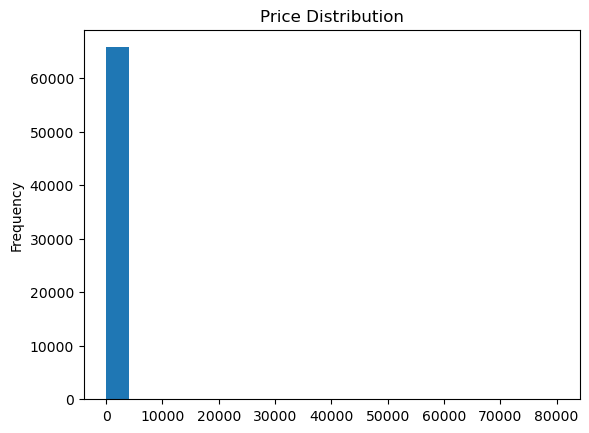

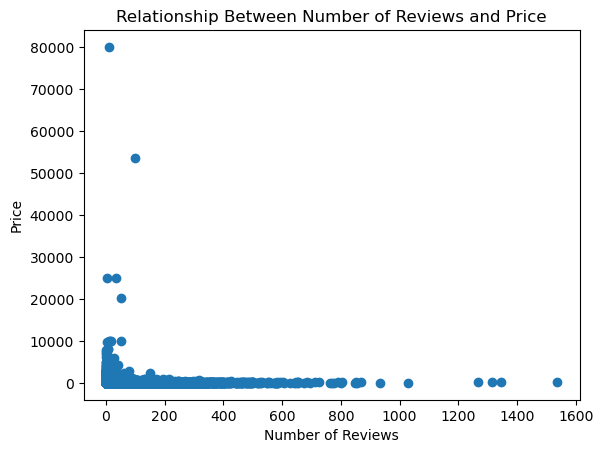

In [29]:
# Price Distribution
df['price'].plot(kind='hist', bins=20, title='Price Distribution')
plt.show()


# Scatter Plot of Price vs. Number of Reviews
plt.scatter(df['number_of_reviews'], df['price'])
plt.title('Relationship Between Number of Reviews and Price')
plt.xlabel('Number of Reviews')
plt.ylabel('Price')
plt.show()